#  Comportamiento check in New york:


In [1]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import powerlaw
from sklearn.metrics import silhouette_score
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from sklearn.cluster import DBSCAN
from sklearn.metrics.pairwise import pairwise_distances
from tslearn.metrics import dtw
from tslearn.clustering import KShape
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.cluster.hierarchy import fcluster
from tslearn.metrics import dtw
import numpy as np
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from collections import Counter
import random
from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import pdist


In [2]:
#Powerlaw: A Python Package for Analysis of Heavy-Tailed Distributions
# Initialize an empty list to store the data
data = []

# Open the text file for reading with the specified encoding
with open(r'C:\Users\oscar\OneDrive - Universidad Nacional de Colombia\Tesis\Comportamineto humano\Articulos New york profe Riascos\dataset_tsmc2014\dataset_TSMC2014_NYC.txt', 'r', encoding='latin-1') as file:
    # Read each line in the file
    for line in file:
        # Split the line into columns based on the tab delimiter
        columns = line.strip().split('\t')
        
        # Append the columns to the data list
        data.append(columns)

# Define the column names
column_names = ['User ID', 'Venue ID', 'Venue category ID', 'Venue category name', 'Latitude', 'Longitude', 'Timezone offset in minutes', 'UTC time']

# Create a DataFrame from the data list
df = pd.DataFrame(data, columns=column_names)

# Optionally, convert columns to appropriate data types
df['Latitude'] = df['Latitude'].astype(float)
df['Longitude'] = df['Longitude'].astype(float)
df['Timezone offset in minutes'] = df['Timezone offset in minutes'].astype(int)

# Display the DataFrame
df.head()


,User ID,Venue ID,Venue category ID,Venue category name,Latitude,Longitude,Timezone offset in minutes,UTC time
0,470,49bbd6c0f964a520f4531fe3,4bf58dd8d48988d127951735,Arts & Crafts Store,40.719810,-74.002581,-240,Tue Apr 03 18:00:09 +0000 2012
1,979,4a43c0aef964a520c6a61fe3,4bf58dd8d48988d1df941735,Bridge,40.606800,-74.044170,-240,Tue Apr 03 18:00:25 +0000 2012
2,69,4c5cc7b485a1e21e00d35711,4bf58dd8d48988d103941735,Home (private),40.716162,-73.883070,-240,Tue Apr 03 18:02:24 +0000 2012
3,395,4bc7086715a7ef3bef9878da,4bf58dd8d48988d104941735,Medical Center,40.745164,-73.982519,-240,Tue Apr 03 18:02:41 +0000 2012
4,87,4cf2c5321d18a143951b5cec,4bf58dd8d48988d1cb941735,Food Truck,40.740104,-73.989658,-240,Tue Apr 03 18:03:00 +0000 2012


In [3]:
print('hay',df['User ID'].unique().size, 'usuarios únicos')
def get_most_entries_user(df):
    user_counts = df['User ID'].value_counts()
    most_entries_user = user_counts.idxmax()
    most_entries_count = user_counts.max()
    return most_entries_user, most_entries_count

most_entries_user, most_entries_count = get_most_entries_user(df)
print(f"The user ID with the most entries is {most_entries_user} with {most_entries_count} entries.")


hay 1083 usuarios únicos
The user ID with the most entries is 293 with 2697 entries.


## 1)Histograma semanal usuario 293

#### Primero intentamos el histograma de la semana para una persona

In [4]:
user_293 = df[df['User ID'] == '293'][['User ID', 'UTC time']]
user_293['UTC time'] = pd.to_datetime(user_293['UTC time'])
user_293 = user_293.sort_values('UTC time')#Esta organizado por este tiempo
user_293['Time Difference τ'] = user_293['UTC time'].diff()


user_293.head()

C:\Users\oscar\AppData\Local\Temp\ipykernel_1892\2112416221.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  user_293['UTC time'] = pd.to_datetime(user_293['UTC time'])


,User ID,UTC time,Time Difference τ
690,293,2012-04-03 23:56:43+00:00,NaT
760,293,2012-04-04 00:19:13+00:00,0 days 00:22:30
763,293,2012-04-04 00:19:44+00:00,0 days 00:00:31
766,293,2012-04-04 00:21:12+00:00,0 days 00:01:28
1121,293,2012-04-04 04:53:06+00:00,0 days 04:31:54


In [5]:
user_293['DAY_OF_THE_WEEK'] = user_293['UTC time'].dt.day_name()
user_293.head()

,User ID,UTC time,Time Difference τ,DAY_OF_THE_WEEK
690,293,2012-04-03 23:56:43+00:00,NaT,Tuesday
760,293,2012-04-04 00:19:13+00:00,0 days 00:22:30,Wednesday
763,293,2012-04-04 00:19:44+00:00,0 days 00:00:31,Wednesday
766,293,2012-04-04 00:21:12+00:00,0 days 00:01:28,Wednesday
1121,293,2012-04-04 04:53:06+00:00,0 days 04:31:54,Wednesday


### 2.1)Sacando un histograma para el lunes

C:\Users\oscar\AppData\Local\Temp\ipykernel_1892\409999547.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_293_monday['Hour'] = user_293_monday['UTC time'].dt.hour + user_293_monday['UTC time'].dt.minute / 60#para incluir los minutos


23.983333333333334 0.2


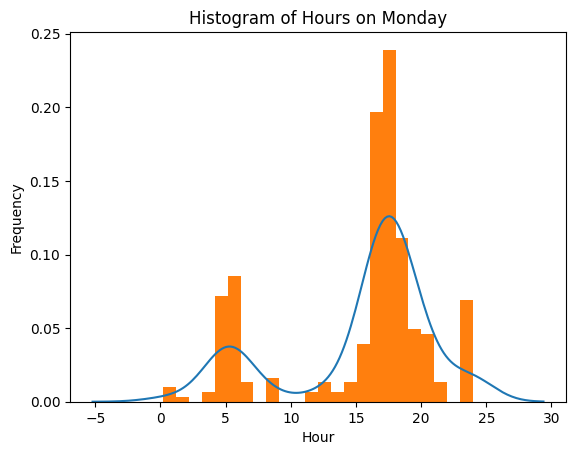

In [6]:

user_293_monday = user_293[user_293['DAY_OF_THE_WEEK'] == 'Monday']

# Create una columna que me de las horas dadas por utc time

user_293_monday['Hour'] = user_293_monday['UTC time'].dt.hour + user_293_monday['UTC time'].dt.minute / 60#para incluir los minutos
user_293_monday.head()

# El histograma
tau_monday= user_293_monday['Hour']
print(max(tau_monday), min(tau_monday))
# hISTOGRAM OF tau_monday
sns.kdeplot(tau_monday)
plt.hist(tau_monday, bins=24, density=True)#toma la frecuenecia en escala log, tenemos binds lineales
plt.xlabel('Hour')
plt.ylabel('Frequency') 
plt.title('Histogram of Hours on Monday')
plt.show()



### 2.2)El histograma de la semana 

In [7]:
# Concatenate the data from all days
user_293_all_days = pd.concat([user_293_monday, user_293[user_293['DAY_OF_THE_WEEK'] != 'Monday']])

# Create a column that represents the hours of the day
user_293_all_days['Hour'] = user_293_all_days['UTC time'].dt.dayofweek * 24 + user_293_all_days['UTC time'].dt.hour + user_293_all_days['UTC time'].dt.minute / 60
user_293_all_days.head()    

# Create a column that represents the hours of the day

user_293_all_days.head(1000)


,User ID,UTC time,Time Difference τ,DAY_OF_THE_WEEK,Hour
6187,293,2012-04-09 11:57:14+00:00,0 days 16:25:52,Monday,11.950000
6188,293,2012-04-09 11:57:30+00:00,0 days 00:00:16,Monday,11.950000
6282,293,2012-04-09 12:32:09+00:00,0 days 00:34:39,Monday,12.533333
6346,293,2012-04-09 12:56:28+00:00,0 days 00:24:19,Monday,12.933333
6709,293,2012-04-09 16:26:07+00:00,0 days 03:29:39,Monday,16.433333
...,...,...,...,...,...
119868,293,2012-07-03 17:57:41+00:00,0 days 00:01:27,Tuesday,41.950000
120345,293,2012-07-03 23:44:07+00:00,0 days 05:46:26,Tuesday,47.733333
120380,293,2012-07-04 00:07:35+00:00,0 days 00:23:28,Wednesday,48.116667
120387,293,2012-07-04 00:09:48+00:00,0 days 00:02:13,Wednesday,48.150000


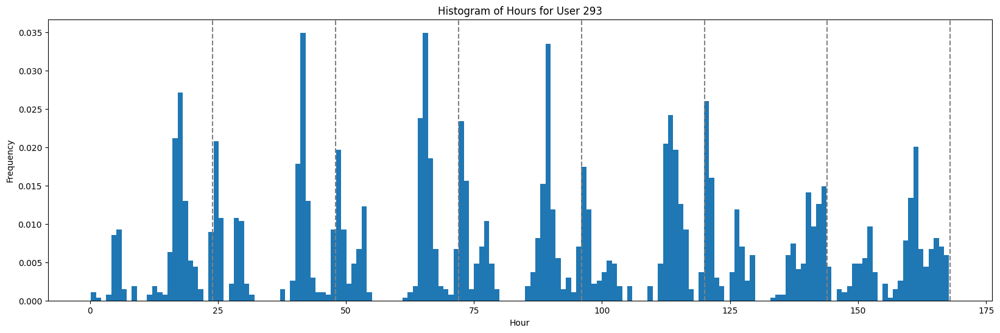

In [8]:
# Plot the histogram

plt.figure(figsize=(20, 6))# Adjust the width and height as needed
#sns.kdeplot(user_293_all_days['Hour'])
plt.hist(user_293_all_days['Hour'], bins=168, density=True)
plt.xlabel('Hour')
plt.ylabel('Frequency')
plt.title('Histogram of Hours for User 293')

# Plot vertical lines at specific hours

hours = [24, 48, 72, 96, 120, 144, 168]
for hour in hours:
    plt.axvline(hour, color='gray', linestyle='--')


plt.show()

#Faltaria ver que se puede representar esa densidad


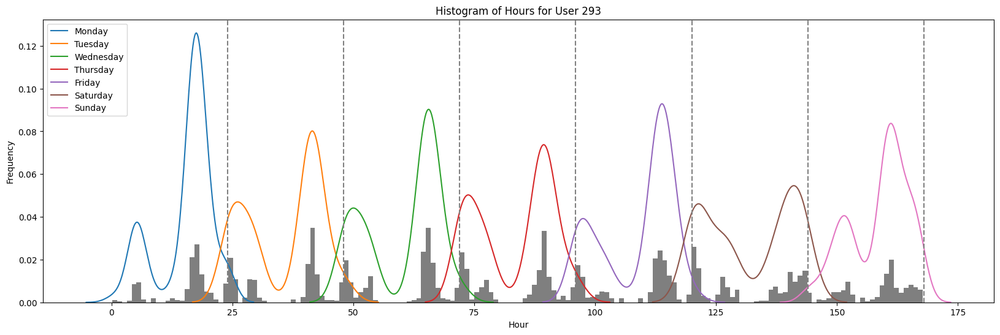

In [9]:
# Plot the histogram

plt.figure(figsize=(20, 6))

# Iterate over each day of the week
for day in user_293_all_days['DAY_OF_THE_WEEK'].unique():
    # Filter the data for the current day
    data = user_293_all_days[user_293_all_days['DAY_OF_THE_WEEK'] == day]['Hour']
    
    # Plot the KDE plot for the current day
    sns.kdeplot(data, label=day)

# Plot the histogram
plt.hist(user_293_all_days['Hour'], bins=168, density=True)
plt.xlabel('Hour')
plt.ylabel('Frequency')
plt.title('Histogram of Hours for User 293')

# Plot vertical lines at specific hours

hours = [24, 48, 72, 96, 120, 144, 168]
for hour in hours:
    plt.axvline(hour, color='gray', linestyle='--')

plt.legend()
plt.show()

#MAYBE TRY THIS The image below illustrate my question. I added the blue line using a KernelDensity 
# (KernelDensity(kernel='Gaussian', bandwidth=1.5).fit(price,sample_weight=quantity)

## 2)Histograma semanal de cualquier usuario:

In [10]:
""" Va a sacar la grafica de todos los usuarios

usuarios=df[['User ID', 'UTC time']] 

# Iterate over each unique user ID
for user_id in usuarios['User ID'].unique():
    # Select the data for the current user
    user_data = usuarios[usuarios['User ID'] == user_id]
    user_data['UTC time'] = pd.to_datetime(user_data['UTC time'])
    user_data = user_data.sort_values('UTC time')
    user_data['DAY_OF_THE_WEEK'] = user_data['UTC time'].dt.day_name()
    user_data_monday = user_data[user_data['DAY_OF_THE_WEEK'] == 'Monday']

    # Create a column that represents the hours of the day
    user_data_monday['Hour'] = user_data_monday['UTC time'].dt.hour + user_data_monday['UTC time'].dt.minute / 60

    # Plot the histogram for Monday
    tau_monday = user_data_monday['Hour']
    print(f"User ID: {user_id}")
    print(f"Max Hour on Monday: {max(tau_monday)}")
    print(f"Min Hour on Monday: {min(tau_monday)}")
    sns.kdeplot(tau_monday)
    plt.hist(tau_monday, bins=24, density=True)
    plt.xlabel('Hour')
    plt.ylabel('Frequency') 
    plt.title(f'Histogram of Hours on Monday for User {user_id}')
    plt.show()

    # Concatenate the data from all days
    user_data_all_days = pd.concat([user_data_monday, user_data[user_data['DAY_OF_THE_WEEK'] != 'Monday']])

    # Create a column that represents the hours of the day
    user_data_all_days['Hour'] = user_data_all_days['UTC time'].dt.dayofweek * 24 + user_data_all_days['UTC time'].dt.hour + user_data_all_days['UTC time'].dt.minute / 60

    # Plot the histogram for all days
    plt.figure(figsize=(20, 6))
    plt.hist(user_data_all_days['Hour'], bins=168, density=True)
    plt.xlabel('Hour')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of Hours for User {user_id}')

    # Plot vertical lines at specific hours
    hours = [24, 48, 72, 96, 120, 144, 168]
    for hour in hours:
        plt.axvline(hour, color='gray', linestyle='--')

    plt.show()
    """ 


' Va a sacar la grafica de todos los usuarios\n\nusuarios=df[[\'User ID\', \'UTC time\']] \n\n# Iterate over each unique user ID\nfor user_id in usuarios[\'User ID\'].unique():\n    # Select the data for the current user\n    user_data = usuarios[usuarios[\'User ID\'] == user_id]\n    user_data[\'UTC time\'] = pd.to_datetime(user_data[\'UTC time\'])\n    user_data = user_data.sort_values(\'UTC time\')\n    user_data[\'DAY_OF_THE_WEEK\'] = user_data[\'UTC time\'].dt.day_name()\n    user_data_monday = user_data[user_data[\'DAY_OF_THE_WEEK\'] == \'Monday\']\n\n    # Create a column that represents the hours of the day\n    user_data_monday[\'Hour\'] = user_data_monday[\'UTC time\'].dt.hour + user_data_monday[\'UTC time\'].dt.minute / 60\n\n    # Plot the histogram for Monday\n    tau_monday = user_data_monday[\'Hour\']\n    print(f"User ID: {user_id}")\n    print(f"Max Hour on Monday: {max(tau_monday)}")\n    print(f"Min Hour on Monday: {min(tau_monday)}")\n    sns.kdeplot(tau_monday)\n  

### 3.1)Creamos un diccionario de todos

In [11]:
usuarios=df[['User ID', 'UTC time']] 


# Create an empty dictionary
hour_dict = {}#SE GUARDARAN LOS VALORES DE LAS HORAS DE CADA USUARIO PARA LOS DIAS DE LA SEMANA SOLAMENTE VERIFICANDO LOS DIAS DE LA SEMANA 

# Iterate over each unique user ID
for user_id in usuarios['User ID'].unique():
    # Select the data for the current user
    user_data = usuarios[usuarios['User ID'] == user_id]
    user_data['UTC time'] = pd.to_datetime(user_data['UTC time'])
    user_data = user_data.sort_values('UTC time')
    user_data['DAY_OF_THE_WEEK'] = user_data['UTC time'].dt.day_name()
    user_data_monday = user_data[user_data['DAY_OF_THE_WEEK'] == 'Monday']

    # Create a column that represents the hours of the day
    user_data_monday['Hour'] = user_data_monday['UTC time'].dt.hour + user_data_monday['UTC time'].dt.minute / 60

    # Concatenate the data from all days
    user_data_all_days = pd.concat([user_data_monday, user_data[user_data['DAY_OF_THE_WEEK'] != 'Monday']])

    # Create a column that represents the hours of the day
    user_data_all_days['Hour'] = user_data_all_days['UTC time'].dt.dayofweek * 24 + user_data_all_days['UTC time'].dt.hour + user_data_all_days['UTC time'].dt.minute / 60

    # Save the array as the value of the dictionary with the key being the user ID
    hour_dict[user_id] = user_data_all_days['Hour'].values

# Print the dictionary
#print(hour_dict)

C:\Users\oscar\AppData\Local\Temp\ipykernel_1892\1051623935.py:11: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  user_data['UTC time'] = pd.to_datetime(user_data['UTC time'])
C:\Users\oscar\AppData\Local\Temp\ipykernel_1892\1051623935.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_data['UTC time'] = pd.to_datetime(user_data['UTC time'])
C:\Users\oscar\AppData\Local\Temp\ipykernel_1892\1051623935.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

C:\Users\oscar\AppData\Local\Temp\ipykernel_1892\1051623935.py:11: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  user_data['UTC time'] = pd.to_datetime(user_data['UTC time'])
C:\Users\oscar\AppData\Local\Temp\ipykernel_1892\1051623935.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_data['UTC time'] = pd.to_datetime(user_data['UTC time'])
C:\Users\oscar\AppData\Local\Temp\ipykernel_1892\1051623935.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

### 3.2)Funcion para graficar cada usuario


In [12]:
def plot_user_hours(user_id,label=''):
    plt.figure(figsize=(20, 6))
    plt.hist(hour_dict[user_id], bins=168)#, density=True)
    plt.xlabel('Hour')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of Hours for User {user_id} and cluster {label}')

    hours = [24, 48, 72, 96, 120, 144, 168]
    for hour in hours:
        plt.axvline(hour, color='gray', linestyle='--')

    plt.show()

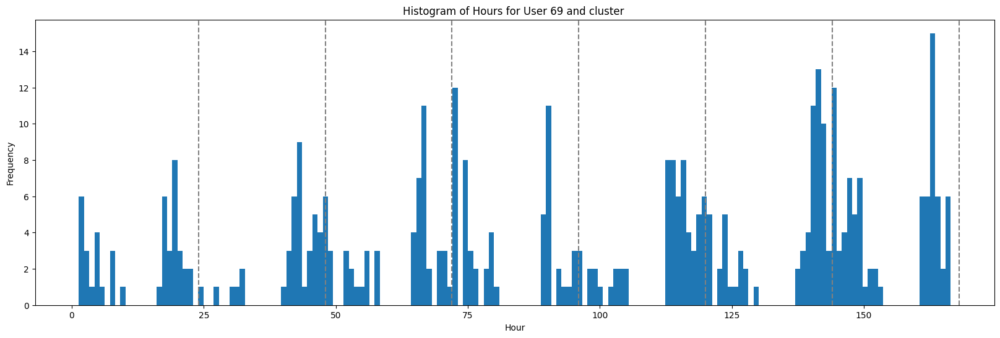

In [13]:
plot_user_hours('69')

In [14]:
hour_dict

{'470': array([ 18.01666667,  18.        ,   1.03333333,   1.73333333,
          7.16666667,   7.16666667,  11.76666667,  12.58333333,
         12.6       ,  12.61666667,  12.65      ,  12.65      ,
         12.66666667,  18.        ,  18.        ,  18.        ,
         42.        ,  47.6       ,  47.76666667,  47.78333333,
         47.78333333,  47.8       ,  47.8       ,  47.85      ,
         47.86666667,  47.86666667,  48.        ,  48.16666667,
         48.2       ,  48.21666667,  48.21666667,  48.23333333,
         48.3       ,  48.31666667,  50.26666667,  50.28333333,
         50.28333333,  50.3       ,  50.3       ,  50.31666667,
         50.33333333,  53.03333333,  53.05      ,  53.3       ,
         53.78333333,  66.        ,  80.16666667,  80.18333333,
         80.18333333,  80.2       ,  80.21666667,  80.65      ,
         80.65      ,  80.86666667,  80.88333333,  80.9       ,
         80.91666667,  80.91666667,  81.        ,  81.03333333,
         81.05      , 147.45     

## 3) Clustering con las frecuencias:

### 3.1) Creamos un diccionario que va a tener las freuencias 

In [15]:
#Hacemos otro diccionario que tenga la frecuencia del histograma de cada usuario para usar esos datos en el clustering
hour_freq_dict = {} #SE GUARDARAN LOS VALORES DE LAS FRECUENCIAS DE LAS HORAS DE CADA USUARIO PARA LOS DIAS DE LA SEMANA SOLAMENTE VERIFICANDO LOS DIAS DE LA SEMANA

# Get the frequencies and bin edges for each array in hour_dict

for user, array in hour_dict.items():
    histo, bin_edges = np.histogram(array, bins=168) #Sin normalizar
    hour_freq_dict[user] = histo

### 3.2)Calculando el nuemro de clusters :

In [16]:
X = np.vstack(list(hour_freq_dict.values()))
frecuencies = np.array(list(hour_freq_dict.values()))#both are the same

c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The 

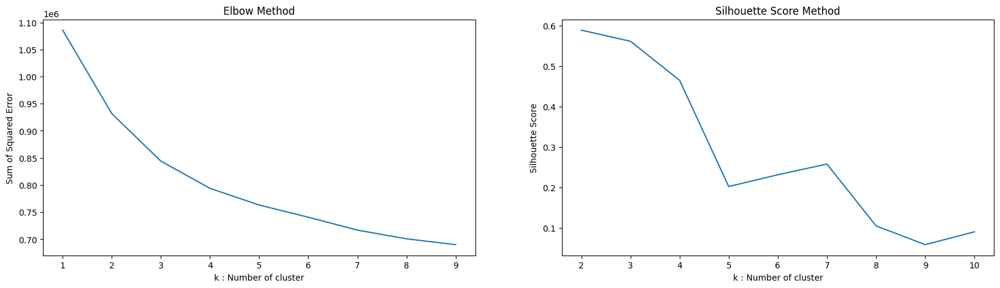

In [17]:
#Find the best number of clusters
def plot_cluster_metrics(data, kmax=10):
    """
    Plots the cluster metrics (Sum of Squared Error and Silhouette Score) for different values of k.

    Parameters:
    - data: The input data for clustering. Works with data frames and arrays.
    - kmax: The maximum number of clusters to consider.

    Returns:
    None
    """
    sse = {}
    sil = []
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(20,5))

    # Elbow Method
    axs[0].set_title('Elbow Method')
    for k in range(1, kmax):
        kmeans = KMeans(n_clusters=k, max_iter=1000, random_state=0).fit(data)
        sse[k] = kmeans.inertia_
    sns.lineplot(x=list(sse.keys()), y=list(sse.values()), ax=axs[0])
    axs[0].set_xlabel("k : Number of cluster")
    axs[0].set_ylabel("Sum of Squared Error")

    # Silhouette Score Method
    axs[1].set_title('Silhouette Score Method')
    for k in range(2, kmax + 1):
        kmeans = KMeans(n_clusters=k, random_state=10).fit(data)
        labels = kmeans.labels_
        sil.append(silhouette_score(data, labels, metric='euclidean'))
    sns.lineplot(x=range(2, kmax + 1), y=sil, ax=axs[1])
    axs[1].set_xlabel("k : Number of cluster")
    axs[1].set_ylabel("Silhouette Score")

    plt.show()

# Call the function with your data
plot_cluster_metrics(frecuencies, kmax=10)

### 3.3)Aplicando kmeans con distancia euclidiana

In [18]:
from sklearn.cluster import KMeans

# Define the number of clusters
n_clusters = 7 

# Initialize KMeans model
kmeans = KMeans(n_clusters=n_clusters, random_state=0)

# Fit KMeans model to the data
kmeans.fit(X)
labels = kmeans.labels_

# Get cluster labels for each user
cluster_labels_dict = hour_dict.copy()
for user, histogram in hour_freq_dict.items():
    cluster_labels_dict[user] = kmeans.predict([histogram])[0]#solo cluster y usuario TRUST

# El problema con el siguente es que es posible que la asignacion del cluster no este bien, parece que se hace con el mismo orden
hour_dict_with_clabels = hour_dict.copy()
for i, user_id in enumerate(hour_dict_with_clabels.keys()):
    hour_dict_with_clabels[user_id] = (hour_dict_with_clabels[user_id], labels[i])
#each user ID key is associated with a tuple of the form (user_array, cluster_label), where user_array is the array of 
# hours and cluster_label is the cluster label assigned to the user.

cluster_counts = Counter(cluster_labels_dict.values())
print('El nuemro de usuarios por cluster es:', cluster_counts)

c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


El nuemro de usuarios por cluster es: Counter({3: 778, 0: 175, 4: 57, 5: 37, 1: 31, 6: 4, 2: 1})


In [19]:
# Iterate over the keys of d1 (assuming the keys are the users)
for user in cluster_labels_dict:
    # Check if the user exists in d2
    if user in hour_dict_with_clabels:
        # Compare the group numbers associated with the user
        group_number_d1 = cluster_labels_dict[user]
        group_number_d2 = hour_dict_with_clabels[user][1]  # Assuming the group number is in the second element of the tuple
        if group_number_d1 != group_number_d2:
            # Print an error message if the group numbers are different
            print(f"Error: Group numbers for user {user} are different between d1 and d2")
        else:
            print(f"User {user} is in the same group in d1 and d2")


User 470 is in the same group in d1 and d2
User 979 is in the same group in d1 and d2
User 69 is in the same group in d1 and d2
User 395 is in the same group in d1 and d2
User 87 is in the same group in d1 and d2
User 484 is in the same group in d1 and d2
User 642 is in the same group in d1 and d2
User 292 is in the same group in d1 and d2
User 428 is in the same group in d1 and d2
User 877 is in the same group in d1 and d2
User 625 is in the same group in d1 and d2
User 691 is in the same group in d1 and d2
User 116 is in the same group in d1 and d2
User 931 is in the same group in d1 and d2
User 53 is in the same group in d1 and d2
User 445 is in the same group in d1 and d2
User 135 is in the same group in d1 and d2
User 895 is in the same group in d1 and d2
User 704 is in the same group in d1 and d2
User 891 is in the same group in d1 and d2
User 284 is in the same group in d1 and d2
User 901 is in the same group in d1 and d2
User 803 is in the same group in d1 and d2
User 699 is in

In [20]:
combined_dict = {}

for user in hour_dict:
    # Check if the user exists in both dictionaries
    if user in cluster_labels_dict:
        # Combine the array of values from dic1 and the code from dic2
        combined_dict[user] = {'array': hour_dict[user], 'cluster': cluster_labels_dict[user]}

In [21]:
combined_dict

{'470': {'array': array([ 18.01666667,  18.        ,   1.03333333,   1.73333333,
           7.16666667,   7.16666667,  11.76666667,  12.58333333,
          12.6       ,  12.61666667,  12.65      ,  12.65      ,
          12.66666667,  18.        ,  18.        ,  18.        ,
          42.        ,  47.6       ,  47.76666667,  47.78333333,
          47.78333333,  47.8       ,  47.8       ,  47.85      ,
          47.86666667,  47.86666667,  48.        ,  48.16666667,
          48.2       ,  48.21666667,  48.21666667,  48.23333333,
          48.3       ,  48.31666667,  50.26666667,  50.28333333,
          50.28333333,  50.3       ,  50.3       ,  50.31666667,
          50.33333333,  53.03333333,  53.05      ,  53.3       ,
          53.78333333,  66.        ,  80.16666667,  80.18333333,
          80.18333333,  80.2       ,  80.21666667,  80.65      ,
          80.65      ,  80.86666667,  80.88333333,  80.9       ,
          80.91666667,  80.91666667,  81.        ,  81.03333333,
         

### 3.4)Graficando los clusters:

In [22]:
# Select 5 random users for each cluster
random_users = {}
for cluster in range(n_clusters):  # range is the number of clusters
    users_in_cluster = [user for user, (user_array, cluster_label) in hour_dict_with_clabels.items() if cluster_label == cluster]
    if len(users_in_cluster) >= 5:
        random_users[cluster] = random.sample(users_in_cluster, 5)
    else:
        random_users[cluster] = users_in_cluster  
        

In [23]:
random_users

{0: ['425', '784', '106', '691', '404'],
 1: ['319', '974', '372', '750', '445'],
 2: ['293'],
 3: ['285', '279', '1049', '573', '222'],
 4: ['503', '494', '1082', '207', '489'],
 5: ['521', '443', '645', '951', '188'],
 6: ['354', '185', '315', '349']}

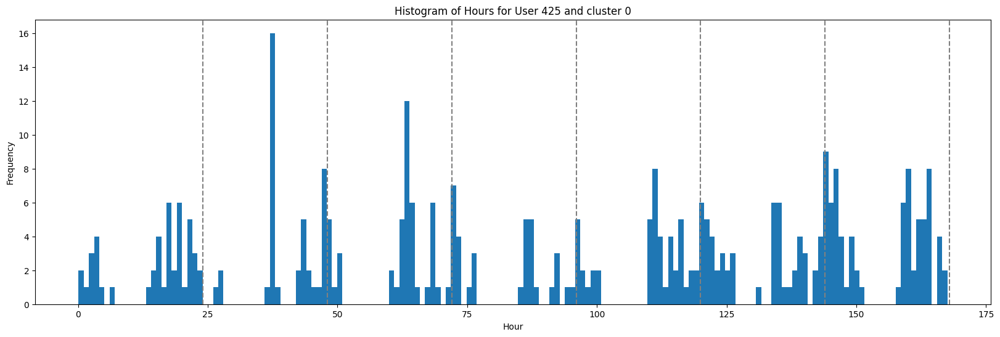

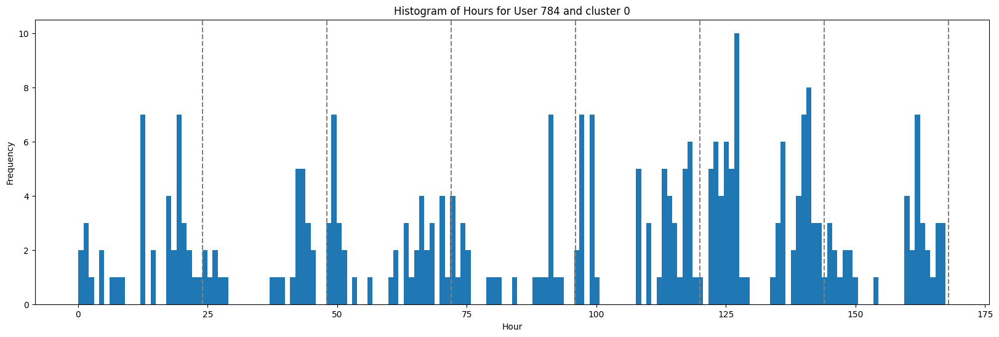

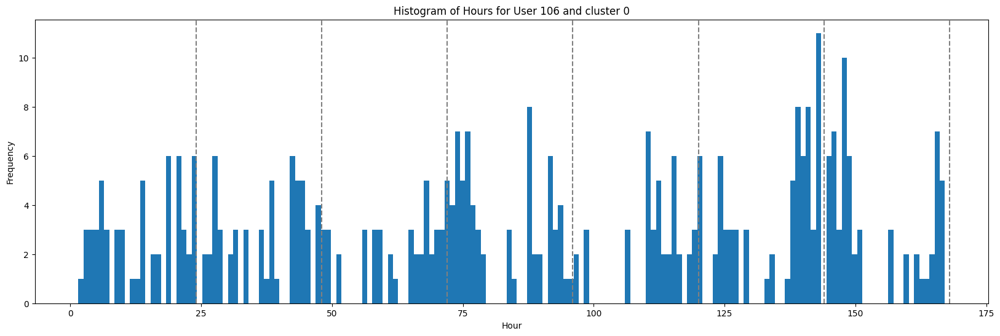

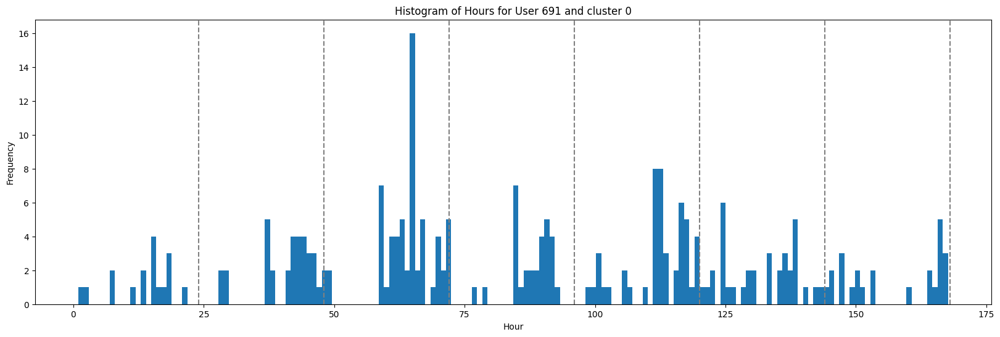

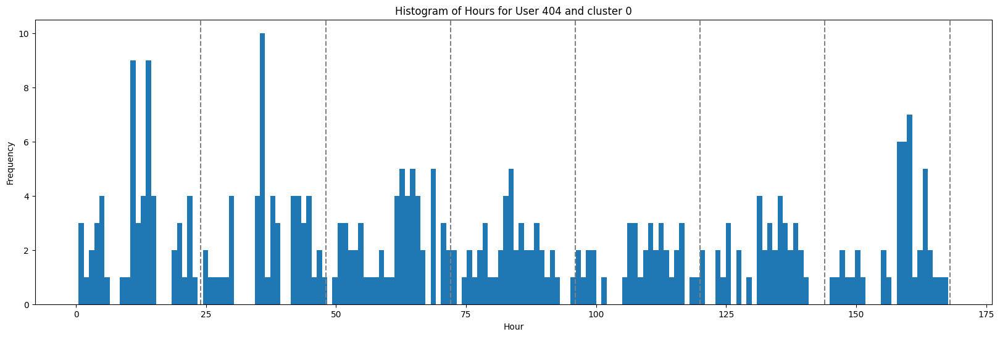

...

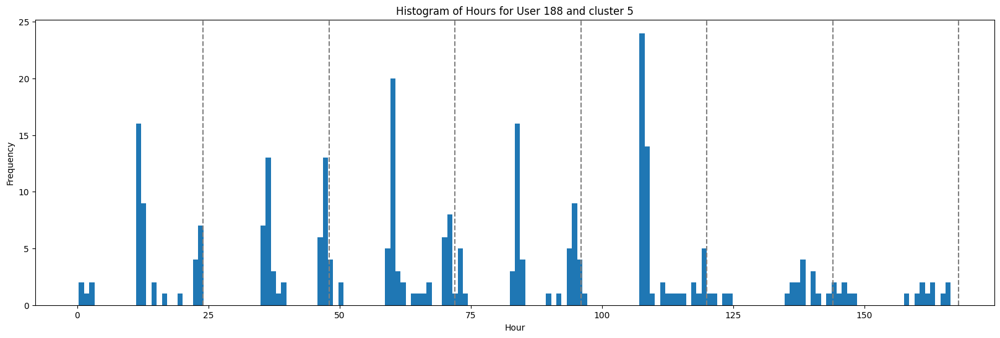

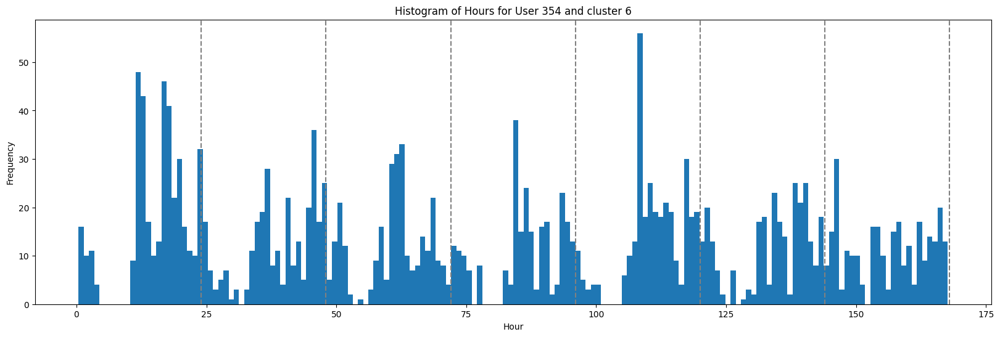

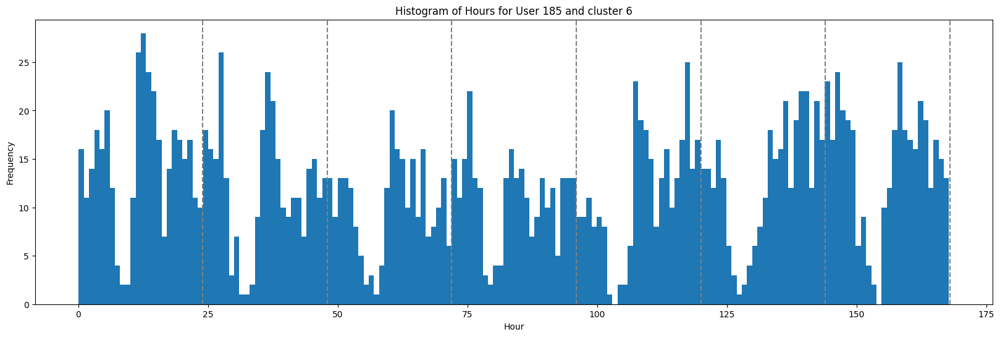

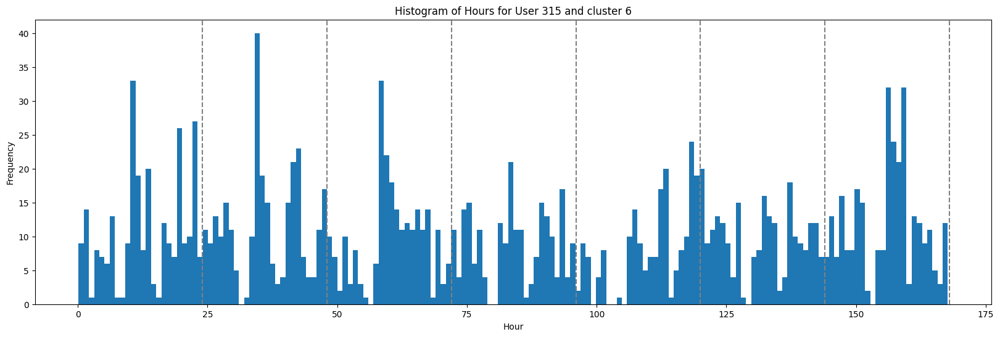

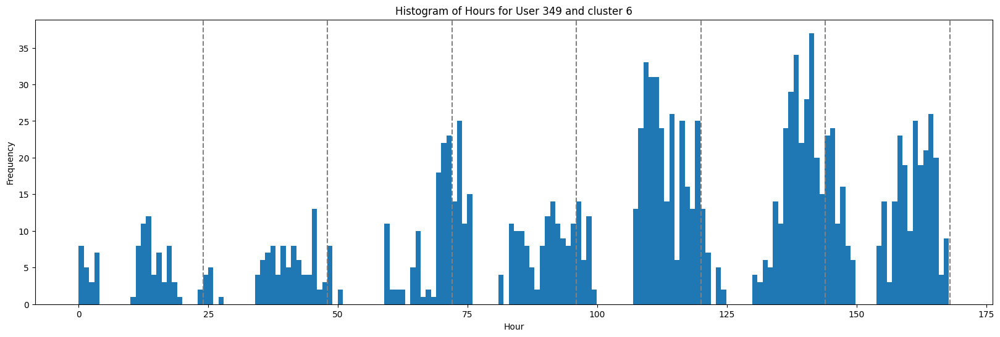

In [24]:
# Plot the hours for the selected users
for cluster, users in random_users.items():
    for user in users:
        plot_user_hours(user,cluster)

In [25]:
rgtht

NameError: name 'rgtht' is not defined

### 3.5) Intentando con DBSCAN

In [ ]:

X = np.vstack(list(hour_freq_dict.values()))
frecuencies = np.array(list(hour_freq_dict.values()))#both are the same

# Define DBSCAN parameters
eps = 5  # Maximum distance between two samples for one to be considered as in the neighborhood of the other
min_samples = 50 # The number of samples in a neighborhood for a point to be considered as a core point

# Initialize DBSCAN model
dbscan = DBSCAN(eps=eps, min_samples=min_samples)

# Fit DBSCAN model to the data
dbscan.fit(X)

# Get cluster labels for each user
cluster_labels_dict = {}
for user, histogram in hour_freq_dict.items():
    cluster_labels_dict[user] = dbscan.labels_[0]
    
    
# Add the cluster labels to the dictionary of user arrays
hour_dict_with_clabels = hour_dict.copy()
for i, user_id in enumerate(hour_dict_with_clabels.keys()):
    hour_dict_with_clabels[user_id] = (hour_dict_with_clabels[user_id], dbscan.labels_[i])


In [ ]:
dbscan.labels_

array([-1, -1, -1, ..., -1, -1, -1], dtype=int64)

In [ ]:
cluster_counts = Counter(cluster_labels_dict.values())
print('El nuemro de usuarios por cluster es:', cluster_counts)

El nuemro de usuarios por cluster es: Counter({-1: 1083})


### 3.6) Intentando con Aglomerative clustering 

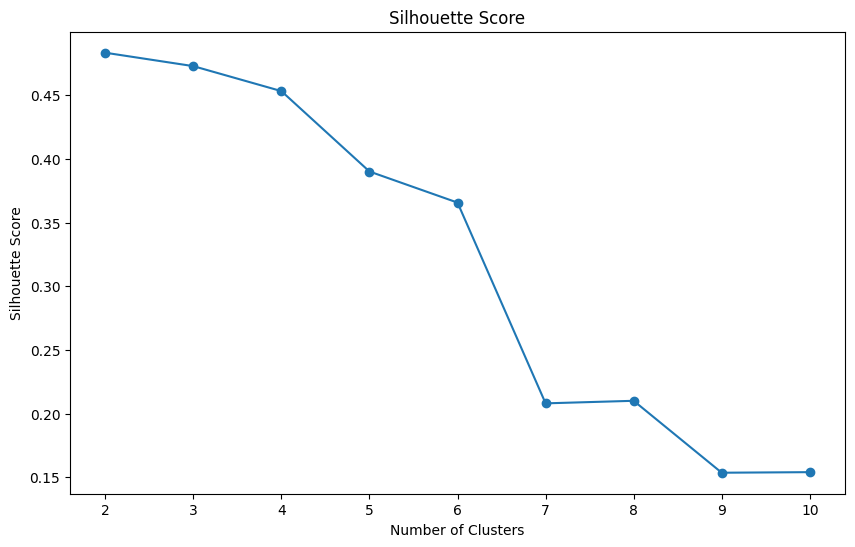

In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
X = np.vstack(list(hour_freq_dict.values()))
# Calculate the silhouette score for different number of clusters
silhouette_scores = []
for n_clusters in range(2, 11):
    model = AgglomerativeClustering(n_clusters=n_clusters)
    labels = model.fit_predict(X)
    silhouette_scores.append(silhouette_score(X, labels))

# Plot the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('Silhouette Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()


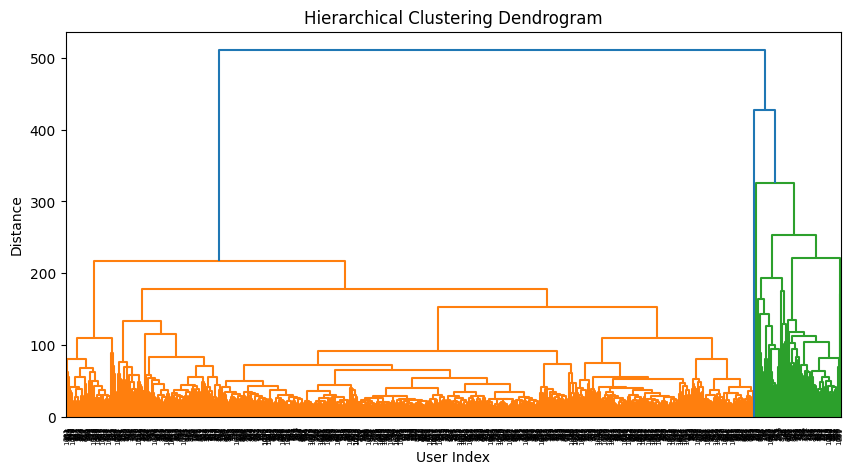

El nuemro de usuarios por cluster es: Counter({1: 889, 2: 73, 6: 73, 0: 41, 3: 4, 4: 2, 5: 1})


In [ ]:

X = np.vstack(list(hour_freq_dict.values()))
frecuencies = np.array(list(hour_freq_dict.values()))#both are the same

# Compute pairwise distances between histograms using Euclidean distance
distance_matrix = pdist(X)

# Compute the linkage matrix
Z = linkage(distance_matrix, method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('User Index')
plt.ylabel('Distance')
plt.show()

n_clusters = 7  # Number of clusters to form

# Initialize AgglomerativeClustering model
agglomerative = AgglomerativeClustering(n_clusters=n_clusters)

# Fit AgglomerativeClustering model to the data
agglomerative.fit(X)

# Fit AgglomerativeClustering model to the data
cluster_labels = agglomerative.fit_predict(X)

# Add cluster labels to hour_freq_dict
cluster_labels_dict=hour_dict.copy()
for i, (user, _) in enumerate(cluster_labels_dict.items()):
    cluster_labels_dict[user] = cluster_labels[i]
    
hour_dict_with_clabels = hour_dict.copy()
for i, user_id in enumerate(hour_dict_with_clabels.keys()):
    hour_dict_with_clabels[user_id] = (hour_dict_with_clabels[user_id], cluster_labels[i])
    
#numero de usuarios por cluster
cluster_counts = Counter(cluster_labels_dict.values())
print('El nuemro de usuarios por cluster es:', cluster_counts)


In [ ]:
hour_dict_with_clabels['354']

(array([12.16666667, 12.16666667, 12.66666667, ..., 60.08333333,
        60.1       , 61.35      ]),
 3)

In [ ]:
cluster_labels_dict['354']

3

In [ ]:
import random
# Select 5 random users for each cluster
random_users = {}
for cluster in range(n_clusters):  # range is the number of clusters
    users_in_cluster = [user for user, (user_array, cluster_label) in hour_dict_with_clabels.items() if cluster_label == cluster]
    if len(users_in_cluster) >= 5:
        random_users[cluster] = random.sample(users_in_cluster, 5)
    else:
        random_users[cluster] = users_in_cluster
        
print(random_users)

{0: ['138', '768', '472', '820', '458'], 1: ['195', '140', '878', '994', '1050'], 2: ['335', '664', '726', '70', '911'], 3: ['354', '185', '315', '349'], 4: ['974', '730'], 5: ['293'], 6: ['72', '376', '159', '45', '1082']}


## 4)Clustering de los histogramas de las personas para series de tiempo

### 4.1)Clustering using features  not raw data:

#### Mirando como son los datos de desviasion estandar y promedio

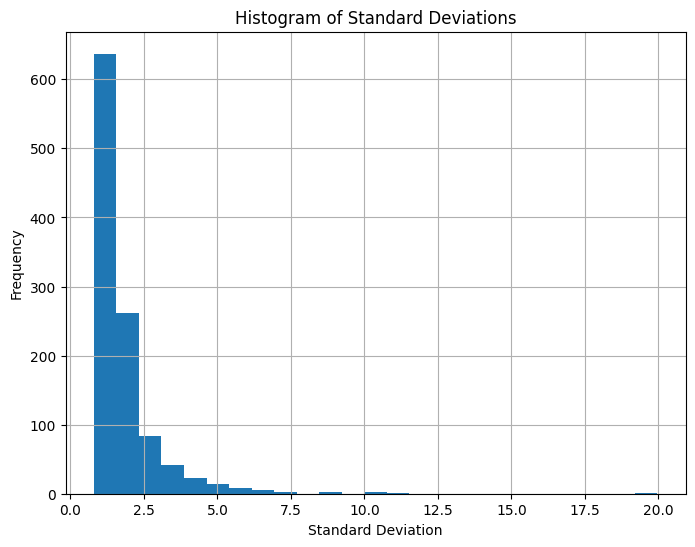

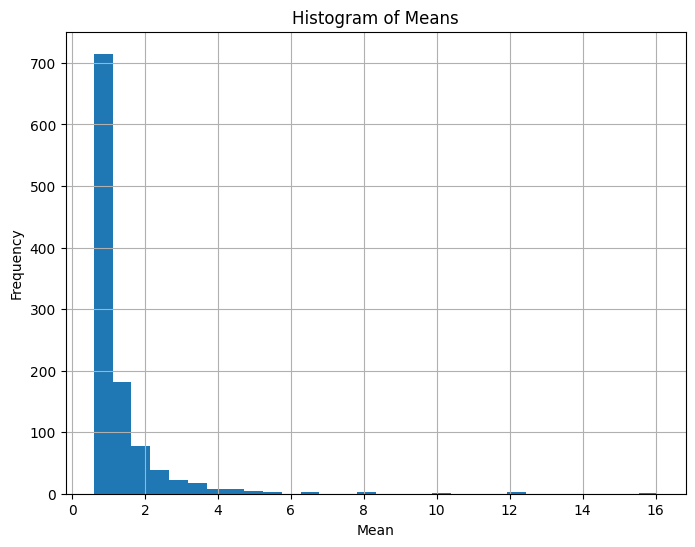

In [ ]:
from scipy.stats import skew
from scipy.stats import kurtosis
features = []#WITCH ARE THE BEST ONES TO USE ??
for user, data in hour_dict.items():
    histogram, _ = np.histogram(data, bins=168)#TODOS CON EL MISMO NUMERO DE BINS
    mean_hist = np.mean(histogram)
    std_hist = np.std(histogram)
    quantiles = np.percentile(data, [25, 50, 75])
    skewness = skew(data)
    kurt = kurtosis(data)
    features.append([mean_hist, std_hist, *quantiles, skewness, kurt])


# Feature extraction: For simplicity, let's use mean and standard deviation of each user's data and kmeans clustering
#features = []#cada elemento es una lista de dos elementos, el promedio y la desviacion estandar
#for user, data in hour_dict.items():
 #   histogram, _ = np.histogram(data, bins=168)
  #  features.append([np.mean(histogram), np.std(histogram)])

# Extract standard deviations
std_devs = [feature[1] for feature in features]

# Plot histogram
plt.figure(figsize=(8, 6))
plt.hist(std_devs, bins=25)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency')
plt.title('Histogram of Standard Deviations')
plt.grid(True)

# Extract means
means = [feature[0] for feature in features]

# Plot histogram
plt.figure(figsize=(8, 6))
plt.hist(means, bins=30)
plt.xlabel('Mean')
plt.ylabel('Frequency')
plt.title('Histogram of Means')
plt.grid(True)
plt.show()
plt.show()



#### 4.1.1)Como no siguen una distribucion Gaussiana se recomineda usar normalizacion 

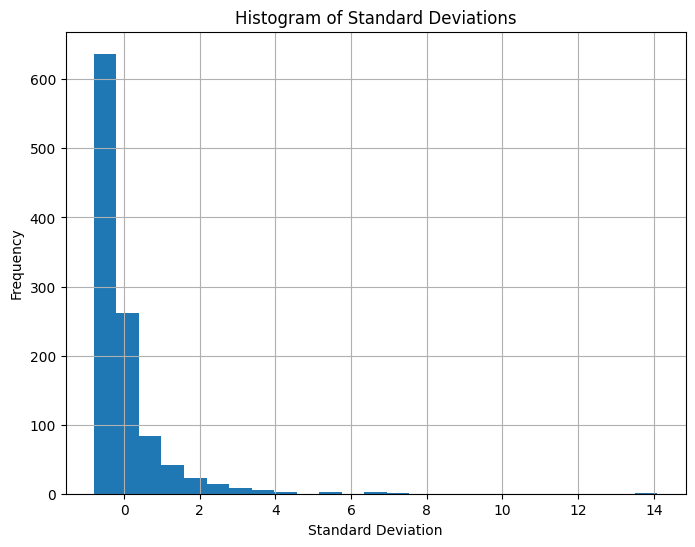

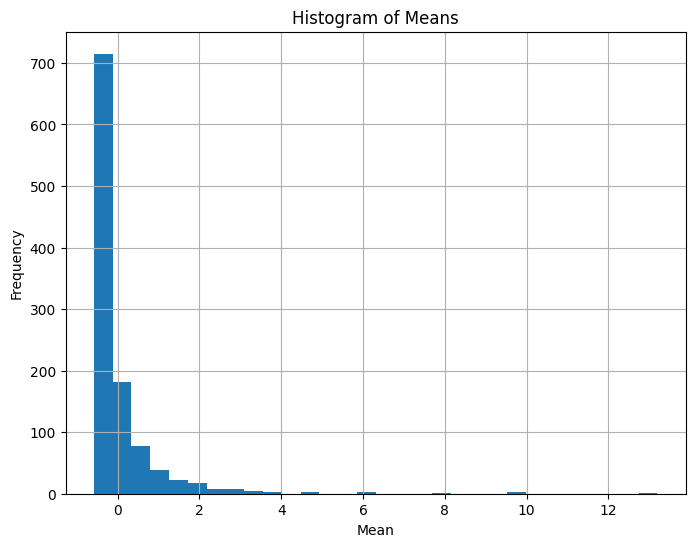

In [ ]:

# Assuming `features` is your list of features
scaler = StandardScaler()
features_normalized = scaler.fit_transform(features)# Extract standard deviations
std_devs = [feature[1] for feature in features_normalized]

# Plot histogram
plt.figure(figsize=(8, 6))
plt.hist(std_devs, bins=25)
plt.xlabel('Standard Deviation')
plt.ylabel('Frequency')
plt.title('Histogram of Standard Deviations')
plt.grid(True)

# Extract means
means = [feature[0] for feature in features_normalized]

# Plot histogram
plt.figure(figsize=(8, 6))
plt.hist(means, bins=30)
plt.xlabel('Mean')
plt.ylabel('Frequency')
plt.title('Histogram of Means')
plt.grid(True)
plt.show()
plt.show()

#### Se puede ver que la normalizacion no es que cambie mucho los datos

#### 4.1.2)Encontrando el numero de clusters al 2D array o la 'tabla'

c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The 

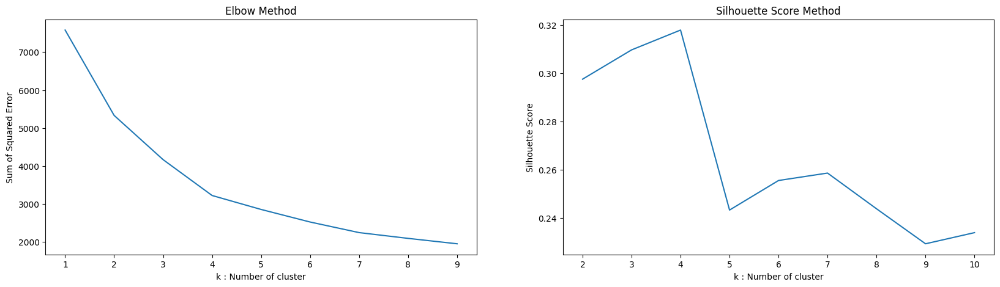

In [ ]:
# Convert features to numpy array, PUEDE SER LAS ORIGINALES O LAS NORMALIZADAS

X = np.array(features_normalized)

#Find the best number of clusters
def plot_cluster_metrics(data, kmax=10):
    """
    Plots the cluster metrics (Sum of Squared Error and Silhouette Score) for different values of k.

    Parameters:
    - data: The input data for clustering. Works with data frames and arrays.
    - kmax: The maximum number of clusters to consider.

    Returns:
    None
    """
    sse = {}
    sil = []
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(20,5))

    # Elbow Method
    axs[0].set_title('Elbow Method')
    for k in range(1, kmax):
        kmeans = KMeans(n_clusters=k, max_iter=1000).fit(data)
        sse[k] = kmeans.inertia_
    sns.lineplot(x=list(sse.keys()), y=list(sse.values()), ax=axs[0])
    axs[0].set_xlabel("k : Number of cluster")
    axs[0].set_ylabel("Sum of Squared Error")

    # Silhouette Score Method
    axs[1].set_title('Silhouette Score Method')
    for k in range(2, kmax + 1):
        kmeans = KMeans(n_clusters=k).fit(data)
        labels = kmeans.labels_
        sil.append(silhouette_score(data, labels, metric='euclidean'))
    sns.lineplot(x=range(2, kmax + 1), y=sil, ax=axs[1])
    axs[1].set_xlabel("k : Number of cluster")
    axs[1].set_ylabel("Silhouette Score")

    plt.show()

# Call the function with your data
plot_cluster_metrics(X, kmax=10)

#### 4.1.3)Aplicamos el algoritmo deseado:

c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


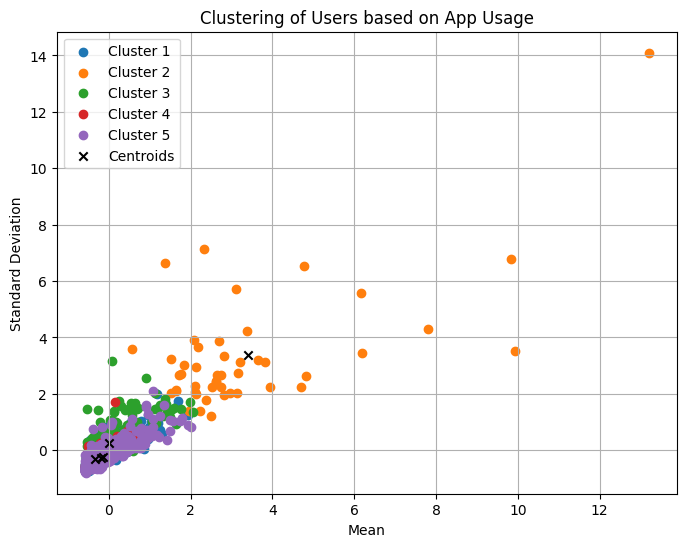

In [ ]:
# Number of clusters
num_clusters = 5

# Apply K-means clustering, O ALGUN OTRO METODO??
kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(X)
labels = kmeans.labels_

#Hacemos una copia del diccionario para no perder la información y hacemos lo siguiente
hour_dict_with_clabels = hour_dict.copy()

# Add the cluster labels to the dictionary of user arrays
for i, user_id in enumerate(hour_dict_with_clabels.keys()):
    hour_dict_with_clabels[user_id] = (hour_dict_with_clabels[user_id], labels[i])
#each user ID key is associated with a tuple of the form (user_array, cluster_label), where user_array is the array of 
# hours and cluster_label is the cluster label assigned to the user.


# Plot the clusters
plt.figure(figsize=(8, 6))
for i in range(num_clusters):
    plt.scatter(X[labels == i, 0], X[labels == i, 1], label=f'Cluster {i+1}')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], color='black', marker='x', label='Centroids')
plt.xlabel('Mean')
plt.ylabel('Standard Deviation')
plt.title('Clustering of Users based on App Usage')
plt.legend()
plt.grid(True)
plt.show()

### 4.2)Clustering using raw data: Imputation

#### 4.2.1)KShape

The K-Shape algorithm uses a shape-based distance measure known as the "Shape-Based Distance" (SBD).

SBD is a measure of similarity between two time series that takes into account both their shapes and their phases. It first normalizes the time series to have zero mean and unit variance, then it aligns them in time to minimize the distance between them.

This makes the K-Shape algorithm particularly suitable for time series clustering, as it can identify clusters of time series that have similar shapes, regardless of their amplitudes or their positions in time.

In [ ]:
#NORMALIZATION AND ORGANIZATION OF DATA BEFORE CLUSTERING??
#los datos deben estar organizados de manera cronológica y la misma longitud 

# Example time series data stored in a dictionary
time_series_data = {
    'user1': np.array([100, 200, 300, 400, 500]),
    'user2': np.array([1, 4, 9, 16]),
    'user3': np.array([3, 6, 9, 12, 15]),
    'user4': np.array([100,105,120,98,99])
}

# Convert dictionary values to a list of numpy arrays
X = [v.reshape(-1, 1) for v in time_series_data.values()]
#[array([[100],
#       [200],
#      [300],
#     [400],
#    [500]]),
#...


#Necesitamos imputar datos faltantes  para que tengan la misma longitud # Padding or resampling to a fixed length, fill with zeros 
max_length = max(len(x) for x in X)
X_padded = pad_sequences(X, maxlen=max_length, padding='post', dtype='float32')

# Convert to numpy array
X_padded = np.array(X_padded)#tiene la misma forma que X

#Calculating the best number of clusters
#?
#?


# Initialize and fit KShape clustering, with 3 clusters
ks = KShape(n_clusters=3, n_init=10, random_state=0)
ks.fit(X_padded)

# Get cluster labels
labels = ks.labels_

#Hacemos una copia del diccionario para no perder la información y guardamos el cluster al cual pertenece cada usuario
time_series_data_labels = time_series_data.copy()

# Add the cluster labels to the dictionary of time_series_data_labels
for i, user_id in enumerate(time_series_data_labels.keys()):
    time_series_data_labels[user_id] = (time_series_data_labels[user_id], labels[i])
#each user ID key is associated with a tuple of the form (user_array, cluster_label), where user_array is the array of 
# hours and cluster_label is the cluster label assigned to the user.


#Lode arriba es lo que pienso aplicar 


NameError: name 'pad_sequences' is not defined

In [ ]:
time_series_data_labels

{'user1': (array([100, 200, 300, 400, 500]), 2),
 'user2': (array([ 1,  4,  9, 16]), 0),
 'user3': (array([ 3,  6,  9, 12, 15]), 2),
 'user4': (array([100, 105, 120,  98,  99]), 2)}

#### 4.2.3)Time-series-kmeans

#### Primero el numero de clusters: Necesita imputación

In [ ]:
#NORMALIZATION AND ORGANIZATION OF DATA BEFORE CLUSTERING?? COST??

# time series data stored in a dictionary
time_series_data = hour_dict.copy()

# Convert dictionary values to a list of numpy arrays
X = [v.reshape(-1, 1) for v in time_series_data.values()]

#Necesitamos imputar datos faltantes Padding or resampling to a fixed length, fill with zeros 
max_length = max(len(x) for x in X)
X_padded = pad_sequences(X, maxlen=max_length, padding='post', dtype='float32')

# Convert to numpy array
X_padded = np.array(X_padded)

# Calculo para saber el numero de clusters
distortions = []
K = range(1,50) # Change this range according to your needs

for k in K:
    km_dtw = TimeSeriesKMeans(n_clusters=k, metric="dtw", random_state=0)
    km_dtw.fit(X_padded)
    distortions.append(km_dtw.inertia_)

plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [ ]:
#NORMALIZATION AND ORGANIZATION OF DATA BEFORE CLUSTERING??

# time series data stored in a dictionary
time_series_data = hour_dict.copy()

# Convert dictionary values to a list of numpy arrays
X = [v.reshape(-1, 1) for v in time_series_data.values()]

#Necesitamos imputar datos faltantes Imputation Techniques
# Padding or resampling to a fixed length, fill with zeros 
max_length = max(len(x) for x in X)
X_padded = pad_sequences(X, maxlen=max_length, padding='post', dtype='float32')

# Convert to numpy array
X_padded = np.array(X_padded)


# Initialize and fit TimeSeriesKMeans clustering with DTW metric
km_dtw = TimeSeriesKMeans(n_clusters=20, metric="dtw", random_state=0)
km_dtw.fit(X_padded)

# Get cluster labels
labels_dtw = km_dtw.labels_

# Print cluster labels
for i, label in enumerate(labels_dtw):
    print(f"User {list(time_series_data.keys())[i]}: Cluster {label}")

#Hacemos una copia del diccionario para no perder la información y guardamos el cluster al cual pertenece cada usuario
time_series_data_labels = time_series_data.copy()

# Add the cluster labels to the dictionary of time_series_data_labels
for i, user_id in enumerate(time_series_data_labels.keys()):
    time_series_data_labels[user_id] = (time_series_data_labels[user_id], labels_dtw[i])
#each user ID key is associated with a tuple of the form (user_array, cluster_label), where user_array is the array of 
# hours and cluster_label is the cluster label assigned to the user.

# Get the number of unique cluster labels
num_clusters = len(np.unique(labels_dtw))
print(f"There are {num_clusters} unique clusters.")

KeyboardInterrupt: 

In [ ]:
time_series_data_labels

{'user1': (array([100, 200, 300, 400, 500]), 0),
 'user2': (array([ 1,  4,  9, 16]), 1),
 'user3': (array([ 3,  6,  9, 12, 15]), 1),
 'user4': (array([100, 105, 120,  98,  99]), 2)}

### 4.3)Original raw data

#### 4.3.1)DTW with Hierarchical clustering:

Dynamic Time Warping (DTW): This is a method for measuring similarity between two temporal sequences, which may vary in speed. For instance, similarities in walking patterns could be detected using DTW, even if one person was walking faster than the other.  It's often used in time series classification and clustering

Longest Common Subsequence (LCSS): This is a measure of similarity between two sequences that takes into account the order of the elements, but not their exact position. It can be used to compare time series of different lengths.

Global Alignment Kernels: These are a family of methods for comparing time series of different lengths. They work by aligning the time series in a way that maximizes their similarity.

Sequence Embedding: Another approach is to transform your sequences into fixed-length vectors using an embedding method, such as Word2Vec or Doc2Vec, and then use any standard method on the embedded vectors.

Remember that the choice of method depends on the specific requirements of your analysis and the characteristics of your data. It's often a good idea to try multiple methods and see which one works best for your data.

##### Getting the number of clusters with elbow methond: IT needs imputation

In [ ]:

time_series_data = hour_dict.copy()

#Because the arrays have diferent length we need to modify them to have the same length and fill missing values with 0
# Calculate the maximum length of the arrays
max_length = max(len(arr) for arr in time_series_data.values())

# Modify the arrays to have the same length and fill missing values with 0
for key in time_series_data.keys():
    arr = time_series_data[key]
    if len(arr) < max_length:
        time_series_data[key] = np.pad(arr, (0, max_length - len(arr)), mode='constant')

# Print the modified time series data
print(time_series_data)

# Calculate pairwise DTW distances
distance_matrix = np.zeros((len(time_series_data), len(time_series_data)))
keys = list(time_series_data.keys())
for i, key1 in enumerate(keys):
    for j, key2 in enumerate(keys):
        if i != j:
            distance_matrix[i, j] = dtw(time_series_data[key1], time_series_data[key2])

# Hierarchical clustering
linkage_matrix = linkage(squareform(distance_matrix), method='single')

# Calculate inertia for different number of clusters
inertia = []
threshold_range = range(1, len(time_series_data) + 1)
for threshold in threshold_range:
    labels = fcluster(linkage_matrix, threshold, criterion='maxclust')
    cluster_centers = np.array([time_series_data[keys[i]] for i in np.unique(labels)])
    inertia.append(np.sum([np.sum((time_series_data[keys[i]] - cluster_centers[labels[i]-1])**2) for i in range(len(keys))]))

# Plot elbow curve
plt.plot(threshold_range, inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.show()

User 470: Cluster 175
User 979: Cluster 392
User 69: Cluster 87
User 395: Cluster 578
User 87: Cluster 322
User 484: Cluster 19
User 642: Cluster 25
User 292: Cluster 145
User 428: Cluster 401
User 877: Cluster 195
User 625: Cluster 598
User 691: Cluster 335
User 116: Cluster 210
User 931: Cluster 117
User 53: Cluster 60
User 445: Cluster 1069
User 135: Cluster 466
User 895: Cluster 470
User 704: Cluster 344
User 891: Cluster 88
User 284: Cluster 652
User 901: Cluster 1075
User 803: Cluster 474
User 699: Cluster 710
User 100: Cluster 197
User 443: Cluster 751
User 689: Cluster 1
User 390: Cluster 17
User 32: Cluster 261
User 230: Cluster 31
User 834: Cluster 15
User 962: Cluster 89
User 1032: Cluster 174
User 525: Cluster 135
User 318: Cluster 156
User 1047: Cluster 460
User 738: Cluster 551
User 364: Cluster 202
User 398: Cluster 913
User 839: Cluster 848
User 424: Cluster 196
User 751: Cluster 875
User 889: Cluster 711
User 612: Cluster 338
User 643: Cluster 757
User 718: Cluster 190

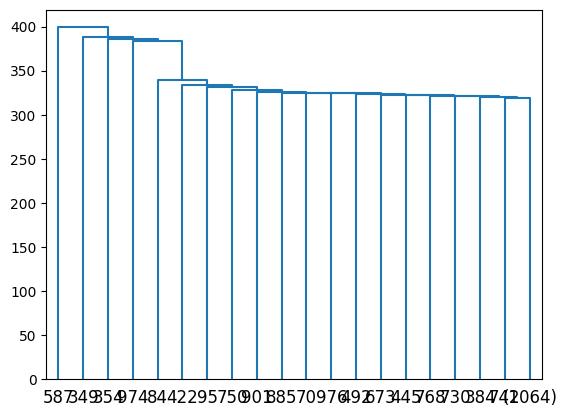

In [ ]:
#NORMALIZATION AND ORGANIZATION OF DATA BEFORE CLUSTERING??

# Example time series data stored in a dictionary
time_series_data = hour_dict.copy()

# Calculate pairwise DTW distances
distance_matrix = np.zeros((len(time_series_data), len(time_series_data)))
keys = list(time_series_data.keys())
for i, key1 in enumerate(keys):
    for j, key2 in enumerate(keys):
        if i != j:
            distance_matrix[i, j] = dtw(time_series_data[key1], time_series_data[key2])

# Hierarchical clustering
linkage_matrix = linkage(squareform(distance_matrix), method='single')

# Plot dendrogram and choose the max graph
dendrogram(linkage_matrix, labels=keys, truncate_mode='lastp', p=20)#Se recomienda que p sea el numeor de clusters que formo + 1
#dendrogram(linkage_matrix, labels=keys)


# Get cluster labels
#threshold = 600  # Adjust as needed, The smaller the threshold, the more clusters there will be, and vice versa.
#cluster_labels = fcluster(linkage_matrix, threshold, criterion='distance')
# Specify the number of clusters directly
num_clusters = 20
cluster_labels = fcluster(linkage_matrix, t=num_clusters, criterion='maxclust')

# Print cluster labels
for i, label in enumerate(cluster_labels):
    print(f"User {keys[i]}: Cluster {label}")
    
time_series_data_labels = time_series_data.copy()

# Add the cluster labels to the dictionary of time_series_data_labels
for i, user_id in enumerate(time_series_data_labels.keys()):
    time_series_data_labels[user_id] = (time_series_data_labels[user_id], cluster_labels[i])
#each user ID key is associated with a tuple of the form (user_array, cluster_label), where user_array is the array of 
# hours and cluster_label is the cluster label assigned to the user.

# Get the number of unique cluster labels
num_clusters = len(np.unique(cluster_labels))
print(num_clusters)

In [ ]:
time_series_data_labels

{'470': (array([ 18.01666667,  18.        ,   1.03333333,   1.73333333,
           7.16666667,   7.16666667,  11.76666667,  12.58333333,
          12.6       ,  12.61666667,  12.65      ,  12.65      ,
          12.66666667,  18.        ,  18.        ,  18.        ,
          42.        ,  47.6       ,  47.76666667,  47.78333333,
          47.78333333,  47.8       ,  47.8       ,  47.85      ,
          47.86666667,  47.86666667,  48.        ,  48.16666667,
          48.2       ,  48.21666667,  48.21666667,  48.23333333,
          48.3       ,  48.31666667,  50.26666667,  50.28333333,
          50.28333333,  50.3       ,  50.3       ,  50.31666667,
          50.33333333,  53.03333333,  53.05      ,  53.3       ,
          53.78333333,  66.        ,  80.16666667,  80.18333333,
          80.18333333,  80.2       ,  80.21666667,  80.65      ,
          80.65      ,  80.86666667,  80.88333333,  80.9       ,
          80.91666667,  80.91666667,  81.        ,  81.03333333,
          81.05   

Divergencia de Jensen shanon, distancia entre histograma, distancia de kul ba claude